# TP I : Descentes de Gradient

Ce TP vise à apporter les éléments nécessaires pour comprendre les implementations des descentes de gradients. **C'est un *TP à trous* ; il s'agira de compléter ces trous et d'y ajouter les tests qui vous sembleront utiles.**

Voici un aperçu des points abordés lors de ce TP.

- partie I
    - Définition d'un ensemble de fonctions test
- partie II
    - Calcul du gradient d'une fonction de manière approchée (pour couvrir des cas où le calcul explicite du gradient est impossible ou pénible).
- partie III
    - La descente dans la direction du Gradient à pas constant
    - Optimisation du pas par Backtracking
- partie IV
    - Choix d'une autre direction que le gradient
        - De plus forte pente en norme $l_1$
        - Gradient conjugué
- partie V
    - Accélération : Momentum, Nesterov, Adam.
- partie VI
    - La Méthode de Newton et la méthode de quasi-Newton

    
Dans l'ensemble du déroulé du TP vous ferez bien attention à valider par un jeu de tests la validité des programmes écrits. Vous regarderez l'influence des paramètres sur la convergence. Vous comparerez les intérêts des diférentes méthodes les unes par rapport aux autres.

**Pour ceux qui souhaiteront choisir ce TP comme base de la note finale, votre démarche et vos conclusions seront présentées sous forme d'un rapport (de 5 à 10 pages) où vous pourrez choisir d'avoir une approche plus sur les résultats mathématiques ou sur les résultats numériques. Le notebook Jupiter avec l'ensemble de vos travaux sera aussi remis. Ces deux éléments devront être remis au plus tard le mercredi 29 juin.**


## Attendus de rendu

Votre rendu sera jugé à l'aune de

- votre capacité à produire des algorithmes valides, répondant à la question posée
- l'étude effectuée concernant la sensibilité de vos algorithmes aux hyperparamètres / conditions initiales
- l'analyse comparative proposée quant aux différentes implémentations suggérées 
- les stress-tests auxquels vous aurez confrontés vos implémentations. 

On portera une attention particulière à la *généricité* de votre réponse ; tout comme cela vous est suggéré par la suite on attendra de vous d'appuyer vos affirmations par suffisamment de tests et une appréciation pour les limites de votre analyse.

Ce TP est à rendre par **groupes de 3** et exceptionnellement **2**.

# Au travail!

In [1]:
import warnings
import math
from time import time

import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns



sns.set_style("whitegrid")
%config InlineBackend.figure_format='retina'

## I- Un set de fonctions tests

Cette partie ne nécessite pas de travail de votre part

Nous allons ici introduire quelques fonctions test qui permettent de représenter les situations suivantes:
- Fonctions globalement convexes ou uniquement localement convexes
- Fonctions admettant ou non un minimum global
- Fonctions admettant ou non des minimums locaux

Nous partons de fonctions définies sur $\mathbb{R}$ mais on verra que cela permet de définir des fonctions "intéressantes" sur $\mathbb{R}^n$.

### Fonctions du set de test

#### 1. Définir des familles de fonctions *convexes* sur $\mathbb{R}$  ou sur une partie de $\mathbb{R}$ ayant un nombre de conditionnement uniquement dépendant des paramètres de la famille.  

In [2]:
def quadratic1_(x,gamma):
    return gamma * (x ** 2) + x + 1

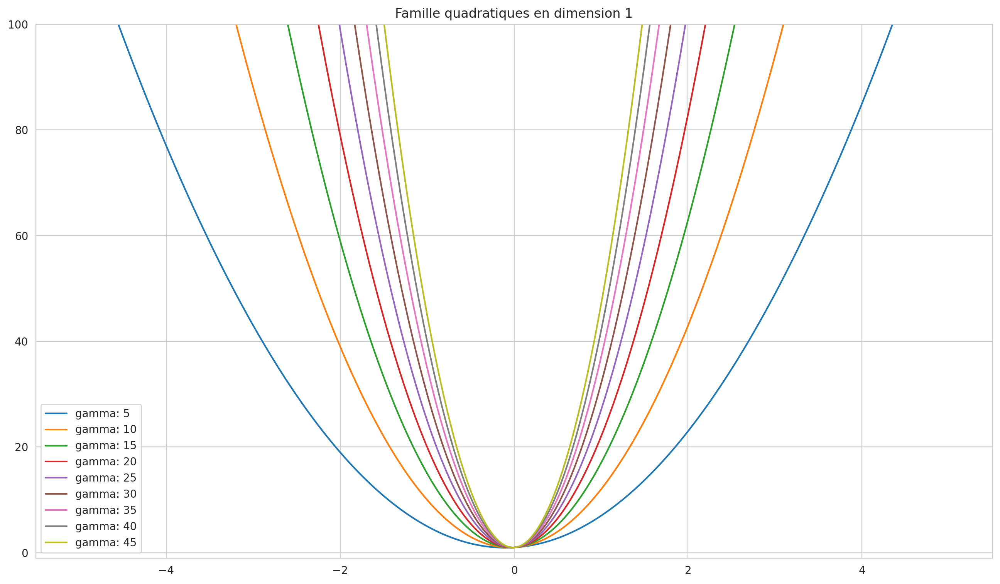

In [3]:
_, ax = plt.subplots(figsize=(16, 9))

x = np.linspace(-5, 5, 400)
ax.set_ylim(-1, 100)

for gamma in range(5, 50, 5):
    ax.plot(x, quadratic1_(x, gamma), label=f"gamma: {gamma}")

ax.set_title("Famille quadratiques en dimension 1")
ax.legend();

In [4]:
def cubic1_(x, gamma):
    return x ** 3 + gamma * x ** 2 + x + 1

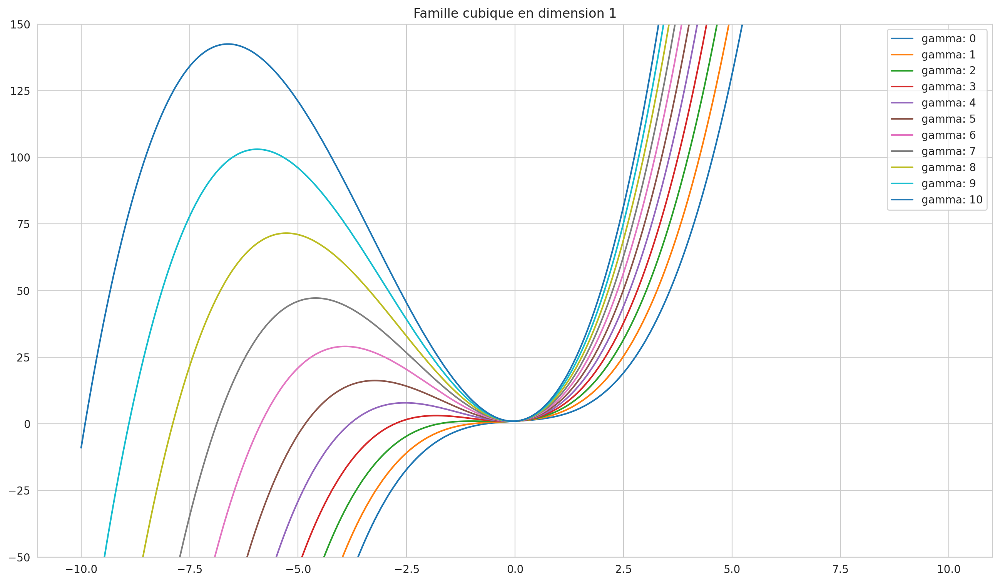

In [5]:
_, ax = plt.subplots(figsize=(16, 9))

x = np.linspace(-10, 10, 400)
ax.set_ylim(-50, 150)

for gamma in range(0, 11, 1):
    ax.plot(x, cubic1_(x, gamma), label=f"gamma: {gamma}")

ax.set_title("Famille cubique en dimension 1")
ax.legend();

In [6]:
def multitrous1_(x, gamma):
    return 20 * np.cos(x ** 2) + (gamma * x ** 2)

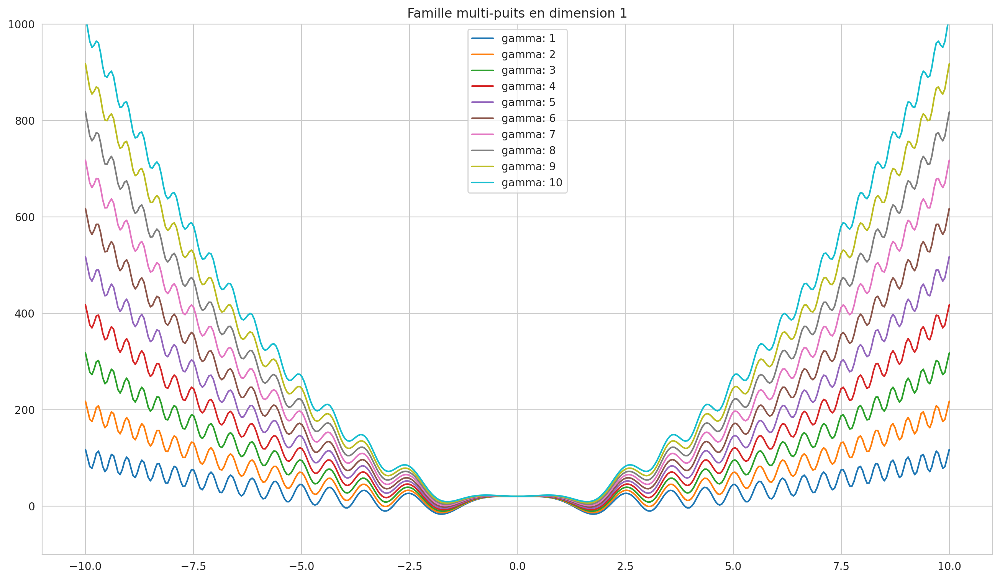

In [7]:
_, ax = plt.subplots(figsize=(16, 9))

x = np.linspace(-10, 10, 400)
ax.set_ylim(-100, 1000)

for gamma in range(1, 11, 1):
    ax.plot(x, multitrous1_(x, gamma), label=f"gamma: {gamma}")
    
ax.set_title("Famille multi-puits en dimension 1")
ax.legend();

#### 2. Faire de même avec des fonctions sur $\mathbb{R}^2$.

In [8]:
def quadratic2_(x, gamma):
    return quadratic1_(x[0], gamma[0]) + quadratic1_(x[1], gamma[1])

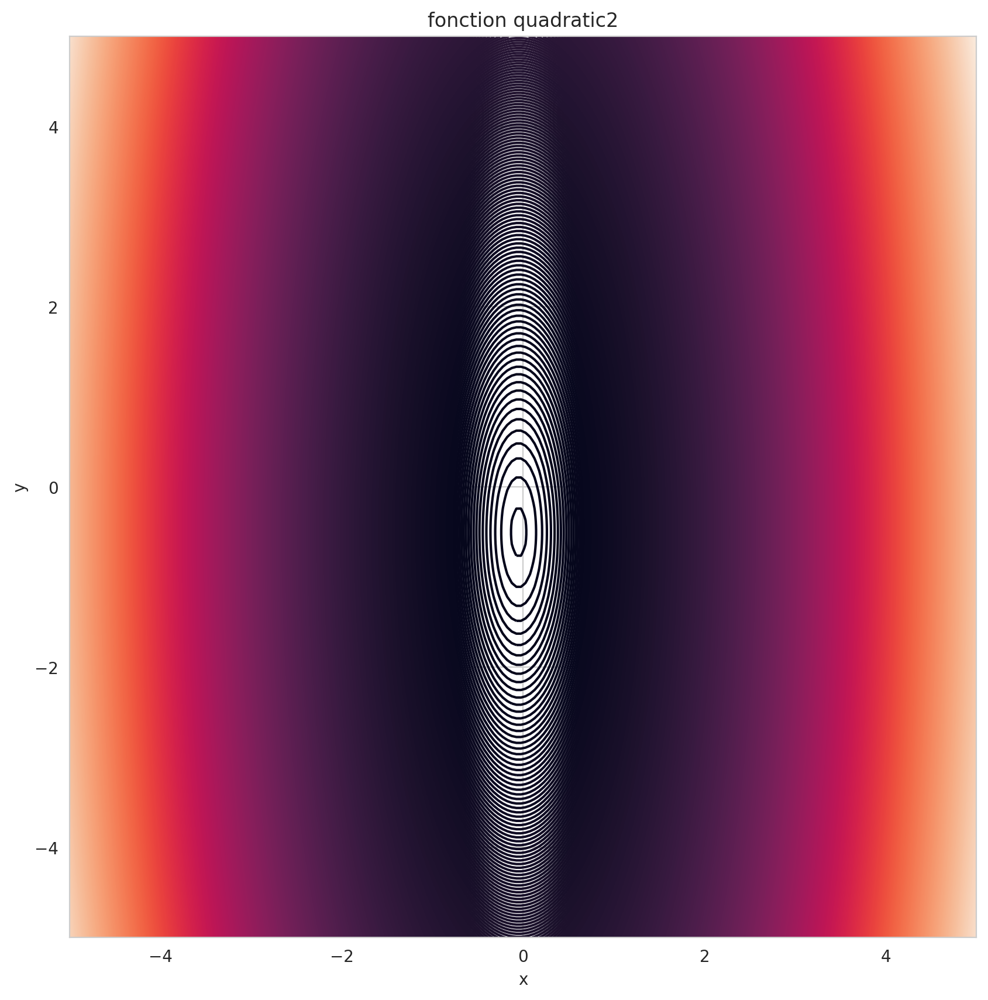

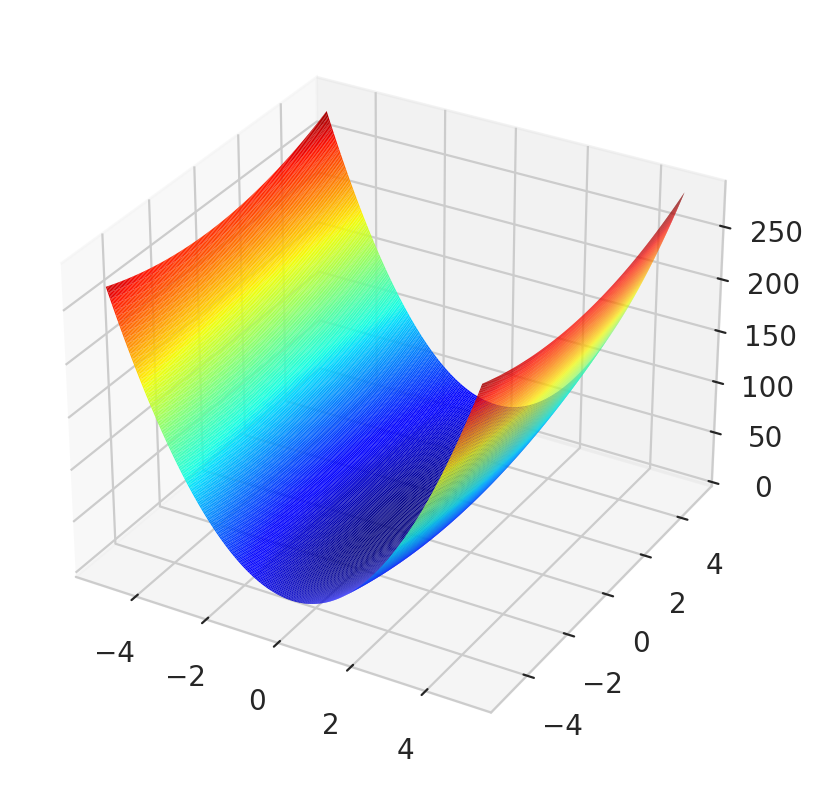

In [9]:
nb_pts, x_mi, x_ma, y_mi, y_ma = 200, -5, 5, -5, 5
x, y = np.linspace(x_mi, x_ma, nb_pts), np.linspace(y_mi, y_ma, nb_pts)
X, Y = np.meshgrid(x, y)

gamma = np.array([10, 1])
Z = np.array([
    [quadratic2_(np.array([X[i,j], Y[i,j]]), gamma) for j in range(nb_pts)]
    for i in range(nb_pts)
])

_, ax = plt.subplots(figsize=(10, 10)) 
ax.contour(X, Y, Z, 1000) 
  
ax.set_title('fonction quadratic2') 
ax.set_xlabel('x') 
ax.set_ylabel('y') 

plt.show()

ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='jet', edgecolor='none');

In [10]:
def cubic2_(x, gamma=10):
    return cubic1_(x[0], gamma) + cubic1_(x[1], gamma)

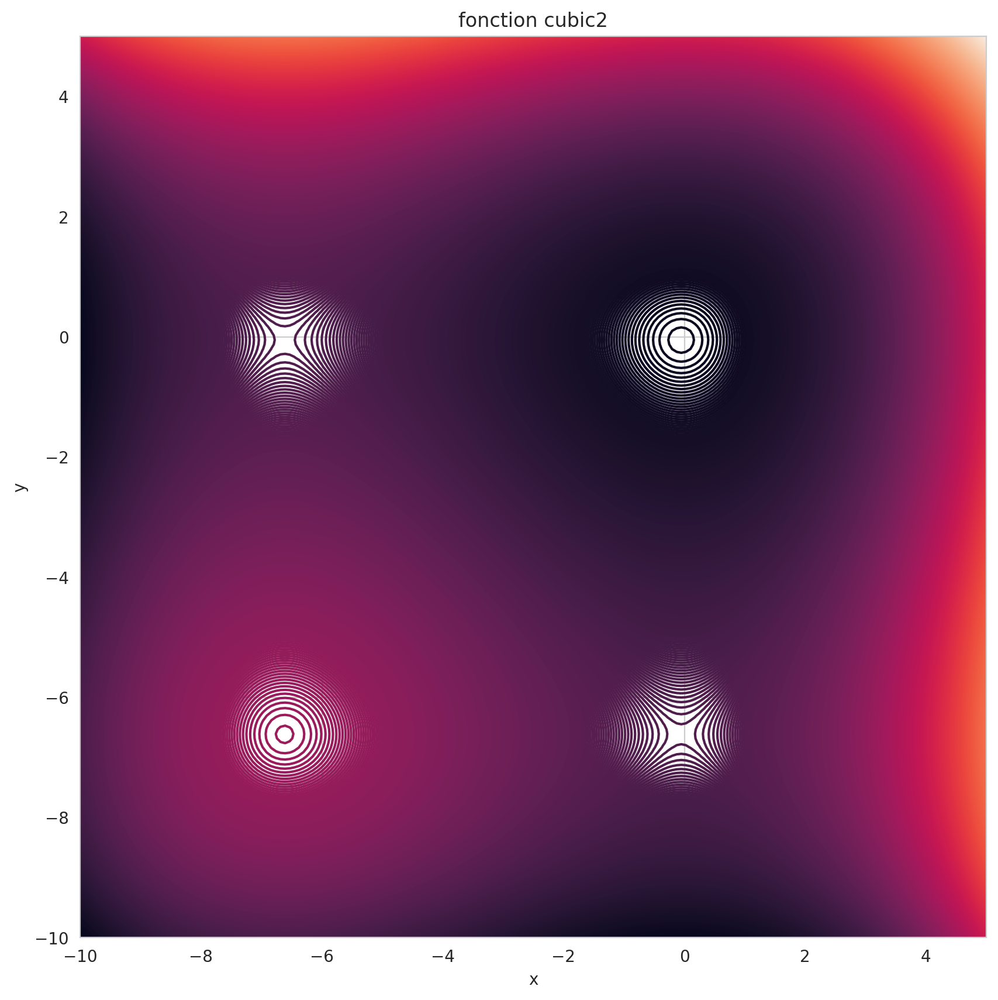

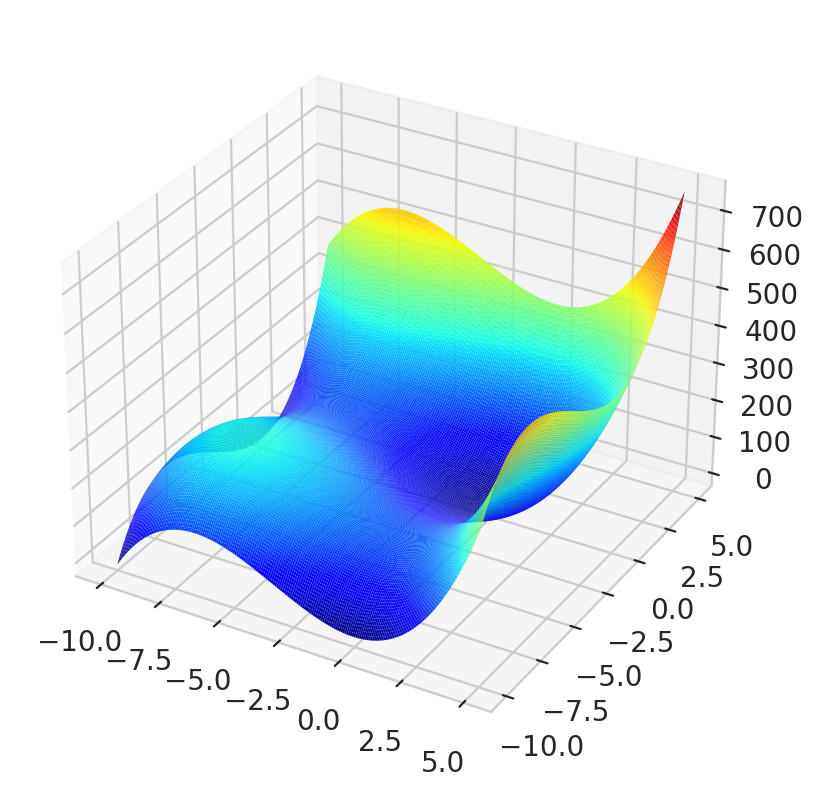

In [11]:
nb_pts, x_mi, x_ma, y_mi, y_ma = 200, -10, 5, -10, 5
x, y = np.linspace(x_mi, x_ma, nb_pts), np.linspace(y_mi, y_ma, nb_pts)
X, Y = np.meshgrid(x, y)

Z = np.array([
    [cubic2_(np.array([X[i,j], Y[i,j]])) for j in range(nb_pts)]
    for i in range(nb_pts)
])

_, ax = plt.subplots(figsize=(10, 10))
ax.contour(X, Y, Z, 1000) 
  
ax.set_title('fonction cubic2') 
ax.set_xlabel('x') 
ax.set_ylabel('y') 

plt.show()

ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='jet', edgecolor='none');

In [12]:
def multitrous2_(x, gamma=4):
    return multitrous1_(x[0], 1) + multitrous1_(x[1], gamma)

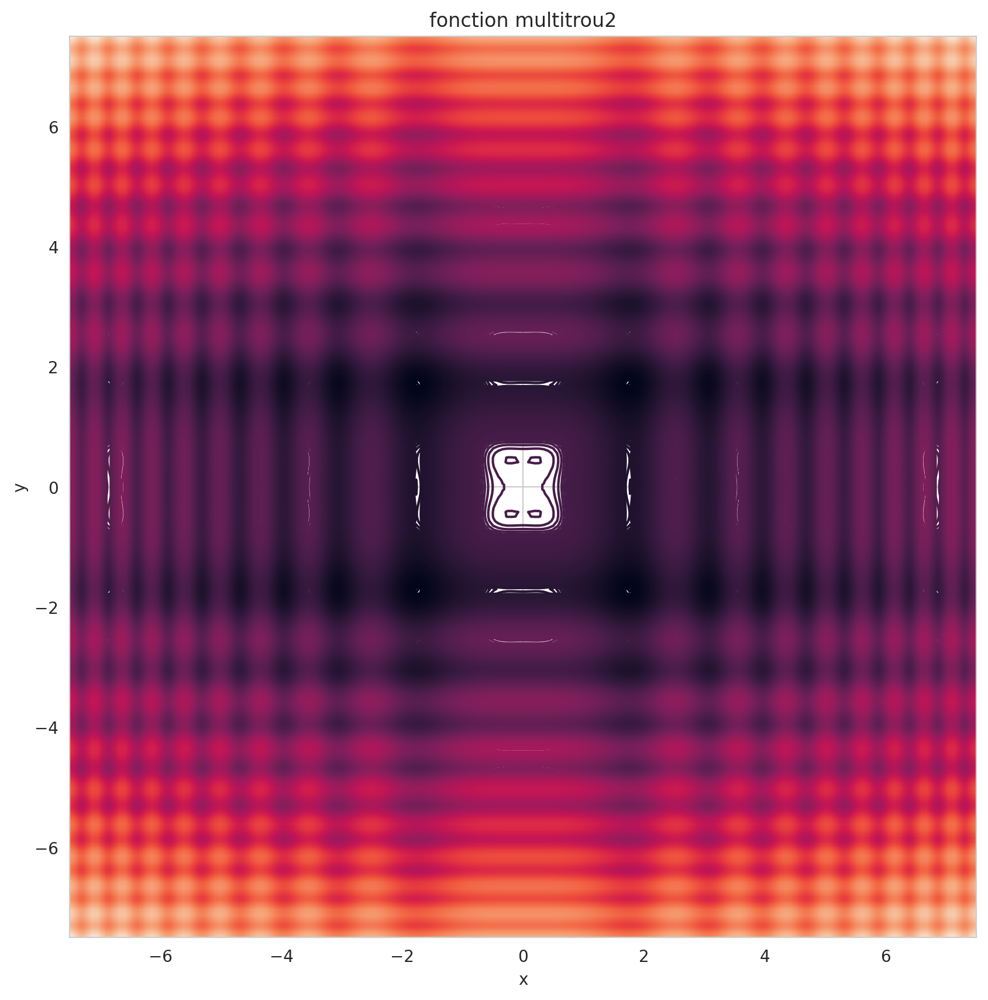

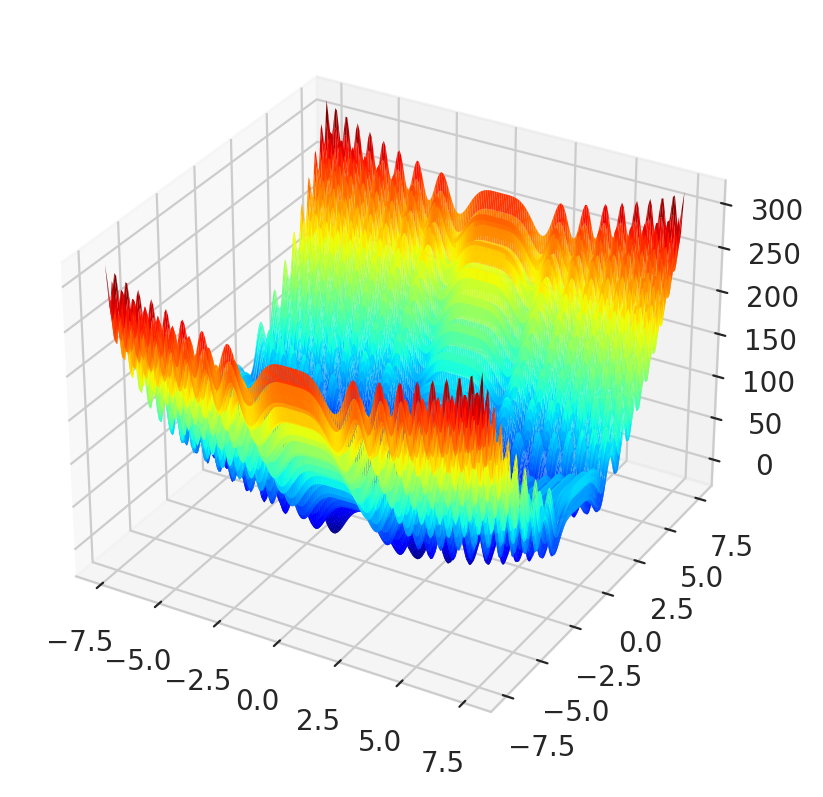

In [13]:
nb_pts, x_mi, x_ma, y_mi, y_ma = 200, -7.5, 7.5, -7.5, 7.5
x, y = np.linspace(x_mi, x_ma, nb_pts), np.linspace(y_mi, y_ma, nb_pts)
X, Y = np.meshgrid(x, y)

Z = np.array([
    [multitrous2_(np.array([X[i,j], Y[i,j]])) for j in range(nb_pts)]
    for i in range(nb_pts)
])

_, ax = plt.subplots(figsize=(10, 10))
ax.contour(X, Y, Z, 1000) 
  
ax.set_title('fonction multitrou2') 
ax.set_xlabel('x') 
ax.set_ylabel('y') 

plt.show()

ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='jet', edgecolor='none');

#### 3. On construit ici une fonction convexe en dimension n

On va prendre comme fonction test la fonction convexe "générique" dans $\mathbb{R}^n$, $ x \mapsto \frac{1}{2}x^T A x-b^Tx$, 

où A est une matrice symétrique définie positive de taille $(n,n)$ et $b$ un vecteur de $\mathbb{R}^n$.

On a vu en cours que cette fonction est convexe, qu'elle admet donc un minimum global sur $\mathbb{R}^n$, et que ce minimum est atteint au point où son gradient s'annule, c'est à dire au point où $Ax=b$.


Une manière commode de construire une matrice $A$ symétrique définie positive est de la voir comme une matrice de la forme $A=U^T U$ avec $U$ triangulaire supérieure car cela nous permet  à la fois de s'assurer qu'elle est symétrique, inversible, positive et en plus de "contrôler" les valeurs propres de $A$ et donc son conditionnement.
Le conditionnement de $A$ est le rapport entre la plus grande et la plus petite de ses valeurs propres. C'est le carré du rapport entre la plus grande et la plus petite des valeurs propres de $U$ qu'on trouve sur la diagonale.


In [14]:
def create_system (dim, cond=10, seed=100):
    np.random.seed(seed)
    A = 0.1 * np.random.uniform(-math.sqrt(cond), math.sqrt(cond), size=(dim,dim))
    A = np.triu(A)
    # on remplace la diagonale de A par des valeurs aléatoires positives entre 1 et sqrt(cond)
    A = A - np.diag(np.diag(A)) + np.diag(np.random.uniform(1, math.sqrt(cond), size=(dim))) 
    # on impose les deux premiers termes de la diagonale diagonale de A pour fixer le conditionnement
    A[0,0] = 1
    A[1,1] = math.sqrt(cond)
    b = 1 * np.random.randint(-10, 10, size=(dim))
    A = A.T @ A
    return A, b

In [15]:
A, b = create_system(5, cond=10)
print(A, b)

[[ 1.         -0.14017151 -0.04773927  0.21805557 -0.3132433 ]
 [-0.14017151 10.01964805  0.6583972  -0.757152    0.19409444]
 [-0.04773927  0.6583972   2.43429773 -0.44063605 -0.24929874]
 [ 0.21805557 -0.757152   -0.44063605  7.56250011 -0.42402717]
 [-0.3132433   0.19409444 -0.24929874 -0.42402717  1.21928084]] [ 4  7  6  5 -3]


In [16]:
def quadraticn_(x):
    return (x.T @ A @ x) / 2 - b.T @ x

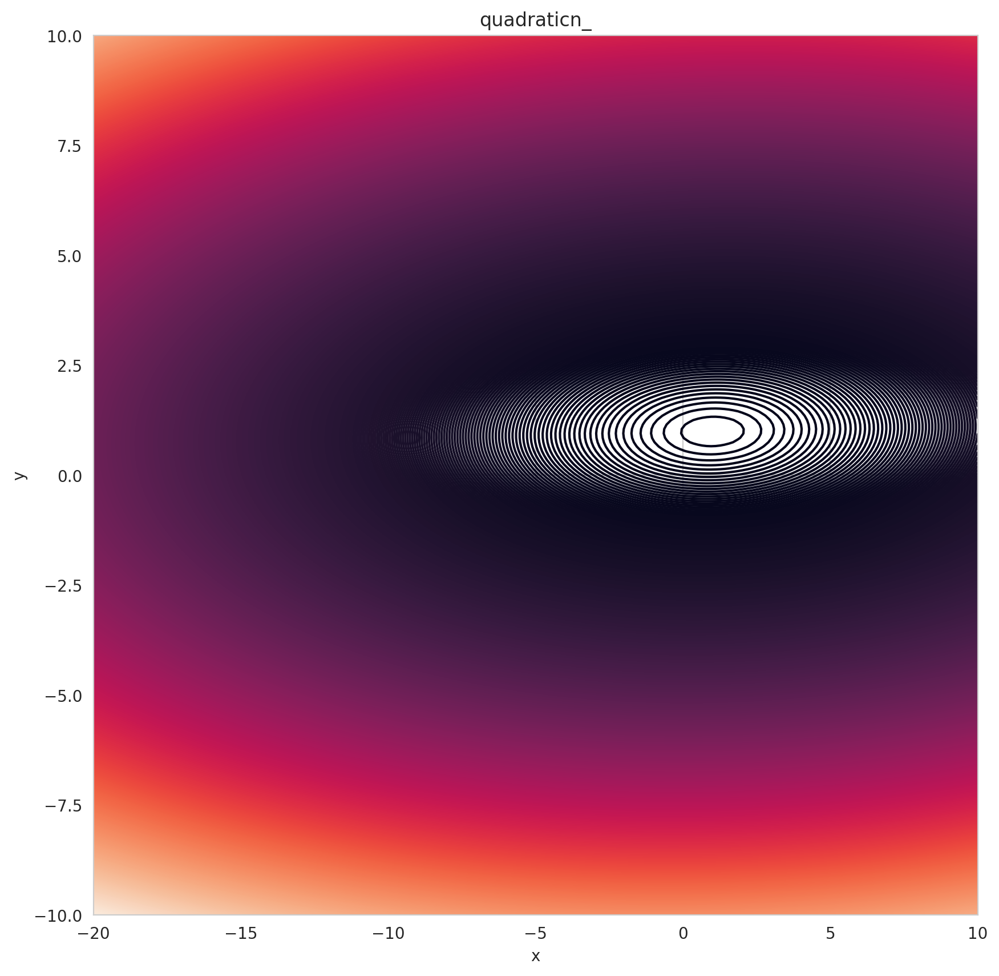

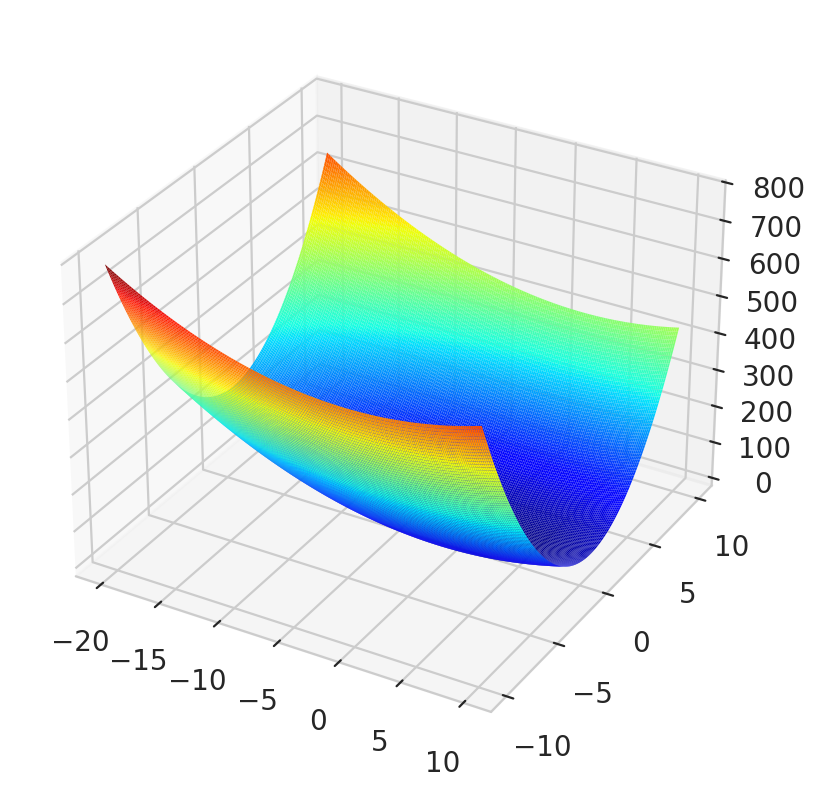

In [17]:
def plot_quadratic2_(cond, *, ax=plt, plot_3d=False, title='quadraticn_'):
    dim = 2
    nb_pts, x_mi, x_ma, y_mi, y_ma = 200, -20, 10, -10, 10

    x, y = np.linspace(x_mi, x_ma, nb_pts), np.linspace(y_mi, y_ma, nb_pts)
    X, Y = np.meshgrid(x, y)

    global A, b
    A, b = create_system(dim, cond)
    b = A @ np.ones(dim)
    
    Z = np.array([
        [quadraticn_(np.array([X[i,j], Y[i,j]])) for j in range(nb_pts)]
        for i in range(nb_pts)
    ])

    ax.contour(X, Y, Z, 1000)

    ax.set_title(title) 
    ax.set_xlabel('x') 
    ax.set_ylabel('y') 

    if (plot_3d):
        plt.show()
        ax = plt.axes(projection='3d')
        ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='jet', edgecolor='none')
    
cond = 10
_, ax = plt.subplots(figsize=(10, 10))
plot_quadratic2_(cond, ax=ax, plot_3d=True)

#### 4. La banane de Rosenbrock

Voici une fonction célèbre pour tester les algorithmes d'optimisation.

$$f(x,y)=(x-1)^2+\gamma (x^2-y)^2$$.

Ce n'est pas évident à visualiser mais cette fonction présente un minimum global unique qui se situe au fond d'une vallée très étroite et en forme de parabole.


In [18]:
def Rosenbrock(x, gamma=100):
    return (x[0] - 1) ** 2 + gamma * (x[0] ** 2 - x[1]) ** 2

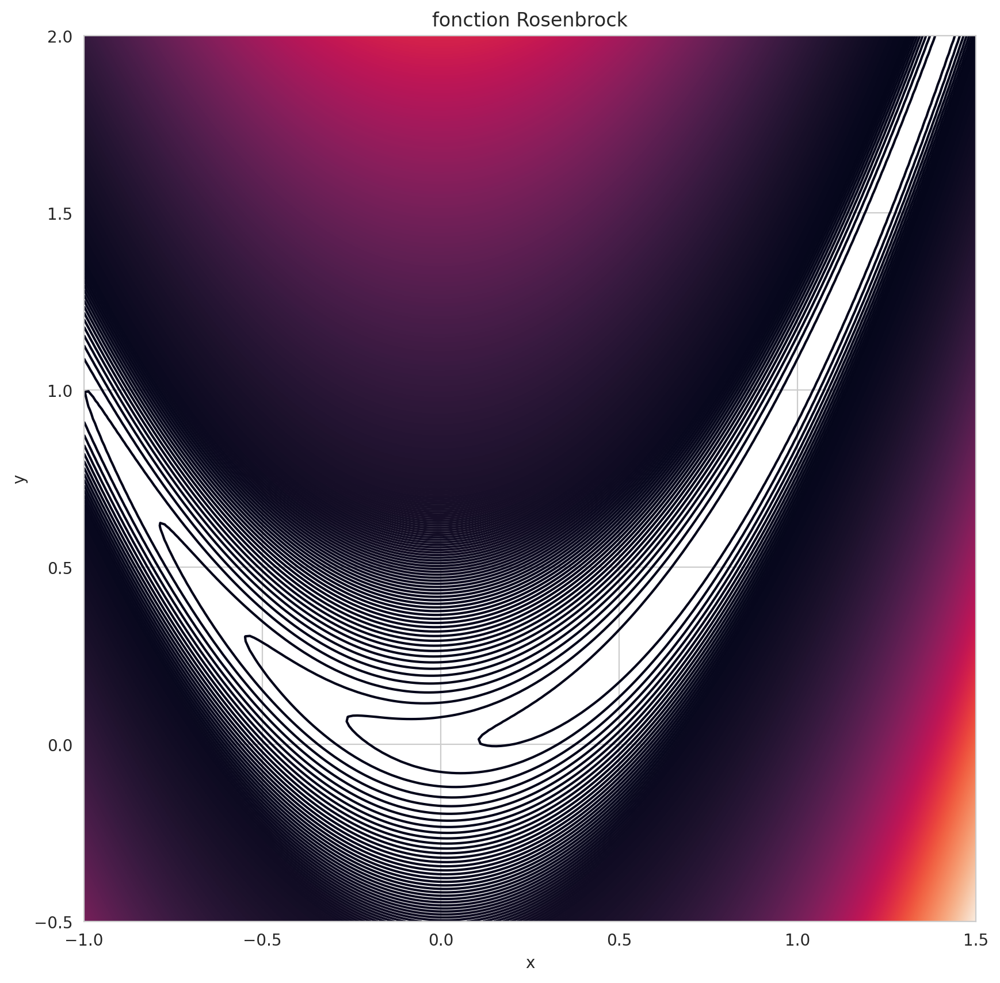

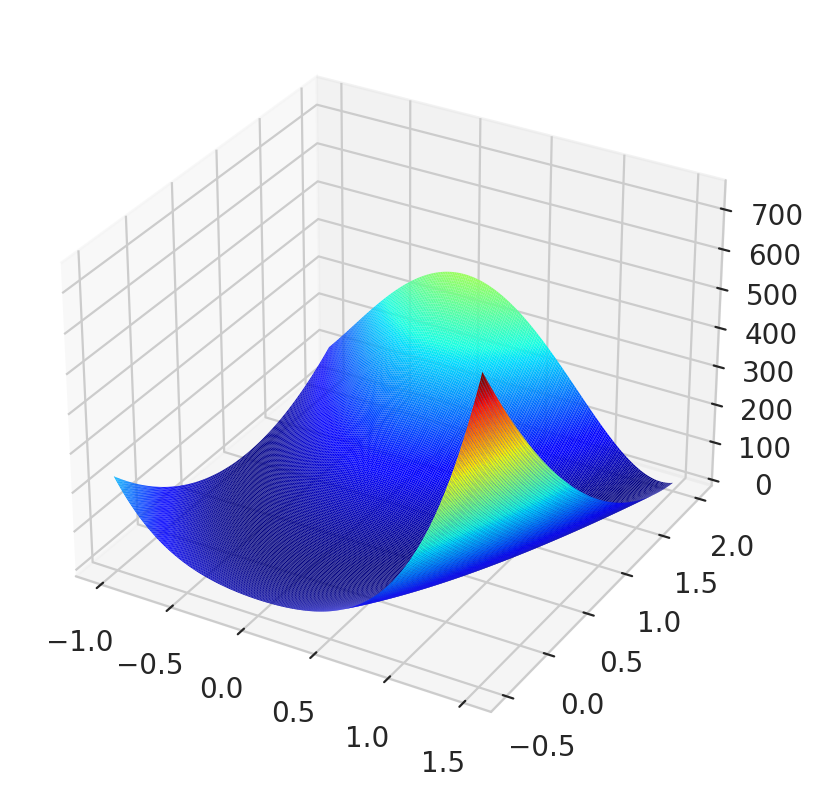

In [19]:
nb_pts, x_mi, x_ma, y_mi, y_ma = 200, -1, 1.5, -0.5, 2
x, y = np.linspace(x_mi, x_ma, nb_pts), np.linspace(y_mi, y_ma, nb_pts)
X, Y = np.meshgrid(x, y)

Z = np.array([
    [Rosenbrock(np.array([X[i,j], Y[i,j]])) for j in range(nb_pts)]
    for i in range(nb_pts)
])

_, ax = plt.subplots(figsize=(10, 10))
ax.contour(X, Y, Z, 1000)

ax.set_title('fonction Rosenbrock') 
ax.set_xlabel('x') 
ax.set_ylabel('y') 

plt.show()

ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='jet', edgecolor='none');

### Conclusion

On voit sur ces quelques exemples que des fonctions d'apparence "innofensives" peuvent avoir des comportements complexes en ce qui concerne leurs extrema locaux ou globaux.

${\bf Nous \, vous \, invitons \, à \, tester}$ les programmes que vous écrirez:
* sur la fonction quadratique pour la dimension n=2 puis n=10, et pour des conditionnements variant de 5 à 1000.
* sur la fonction de Rosenbrock pour des valeurs de gamma variant de 5 à 100

## II- Différencier une fonction numériquement

On verra aussi comment calculer le gradient de manière approchée. Cela est particulièrement utile quand la seule information disponible sur la fonction à minimiser est sa valeur en tout point.

Pour calculer le gradient d'une fonction on a déjà besoin de savoir calculer la dérivée d'une fonction réelle, et on en tire ensuite une version numérique du gradient.

### Le calcul numérique de la dérivée

Pour $h$ assez petit on peut approcher $f'(x)$ par 
$$ f'(x) \simeq \frac{f(x + h) - f(x)}{h} .$$
L'erreur de l'approximation est en $o(1)$ quand $h \to 0$. 

$$ $$
On peut en réalité faire un peu mieux en approchant $f'(x)$ par 
$$f'(x) \simeq \frac{f(x+h)-f(x-h)}{2h}$$.
On trouve que l'erreur d'approximation dans le second cas est désormais en $o(h)$ quand $h \to 0$; ce qui est a priori meilleur.

#### 1. Utiliser la démarche précédente pour approcher la dérivée partielle d'une fonction en un point. Cette fonction sera notée `partial`.

In [20]:
def partial(f, x, i=0, dx=1e-8):
    """Computes i-th partial derivative of f at point x.
    
    Args:
        f: objective function.
        x: point at which partial derivative is computed.
        i: coordinate along which derivative is computed.
        dx: slack for finite difference.
        
    Output:
        (float)

    """
    h = np.zeros(x.size)
    h[i] = dx
    return (f(x + h) - f(x - h)) / (2 * dx)

#### 2. Comparer `partial` à l'expression exacte de la dérivée partielle d'une fonction de votre choix. 

In [21]:
def f(x):
    return np.exp(x)

f_partial = f # The derivative of exp() is exp()

x = np.array([100])

partial_approximation = partial(f, x)
partial_real = f_partial(x)

f"The margin of error of approximation of the partial derivative, in this example, is: {np.abs(partial_approximation - partial_real)[0]:.2e}"

'The margin of error of approximation of the partial derivative, in this example, is: 1.70e+37'

### Le calcul du gradient

Comme dit précédemment, comme le calcul exact du gradient n'est parfois pas possible ou facile, on se garde la possibilité de calculer numériquement le gradient d'une fonction.

#### 1. Écrire une fonction `gradient` qui renvoie le gradient d'une fonction en un point grâce à la fonction précédente

In [22]:
def gradient(f, x, dx=1e-8):
    """Computes gradient of f at point x.
    
    Args:
        f: objective function.
        x: point at which gradient is computed.
        dx: slack for finite difference of partial derivatives.
        
    Output:
        (ndarray) of size domain of f.
        
    """
    return np.array([partial(f, x, i=i, dx=dx) for i in range(x.shape[0])])

#### 2. Tester cette fonction gradient sur une fonction connue.

In [23]:
def f2(x):
    return x[0] ** 5 + x[1] ** 2

def f2_gradient(x):
    return (5 * x[0] ** 4, 2 * x[1])

x = np.array([1, 10])

gradient_approximation = gradient(f2, x)
gradient_real = f2_gradient(x)

f"The maximum approximation error of the gradient, in this example, is: {np.max(np.abs(gradient_approximation - gradient_real)):.2e}"

'The maximum approximation error of the gradient, in this example, is: 1.65e-06'

## III- Descente du gradient

Tout d'abord, nous allons implémenter des descentes qui se feront dans la direction du Gradient


### le cas générique de descente de gradient avec un pas constant


* prendre un point de départ au hasard ${\bf p_0}$.

Quand on est au point ${\bf p_k}$

* calculer le gradient de J en ce point $\nabla J({\bf p_k})$

* On choisit une direction de descente ${\bf d}_k = - \nabla J({\bf p}_k)$

* avancer dans cette direction : ${\bf p}_{k+1} = {\bf p}_k + \mu \, {\bf d}_k$

et on recommence cette dernière étape jusqu'à ce qu'on arrive à un point fixe c.a.d. que 
$|| {\bf p}_{k+1} - {\bf p}_k|| < \varepsilon$ avec $\varepsilon$ une toute petite valeur.

Implémenter cette méthode, la tester sur des fonctions tests définies plus haute, observer en particulier le comportement en fonction de $\mu$ qui est le pas constant.

Attention: bien prévoir dans le code des conditions pour éviter de se retrouver piégé dans des boucles infinies !!!

#### 1. Implémenter cette méthode, la tester sur des fonctions tests définies plus haute, observer en particulier le comportement en fonction de $\mu$ qui est le pas constant.

Attention: bien prévoir dans le code des conditions pour éviter de se retrouvé piégé dans des boucles infinies !!!
On conseille de stocker les différentes valeurs calculées pour les points ${\bf p_k}$ afin de pouvoir "regarder" la manière dont la convergence se passe.

In [24]:
def general_desc_grad(f, p0, _get_pk_next, *, mu=0.001, eps=1E-6, max_step=10_000, no_error=False):
    """General gradient descent algorithm.
    The selection of the next iteration is done through `_get_pk_next`.
    
    Args:
        p0: starting point.
        f: objective function.
        _get_pk_next: function that compute the next `pk` from the current one.
        mu: constant step value (0.001 by default).
        eps: criteria from which we will consider the sequence as "constant" (1E-6 by default).
        max_step: maximal number of steps until the algorithm is considered to diverge (10_000 by default).
        no_error: should the function raise an error when it fails to converge ?
            If set to True, the list of pk is returned anyway
            Otherwise, raise an error
    
    Output:
        (ndarray) Array containing the set of successive positions p_k.
    """
    pk_list = [p0]
    
    pk = p0
    pk_next = _get_pk_next(pk)
    
    while (np.linalg.norm(pk_next - pk) >= eps and len(pk_list) <= max_step):
        pk = pk_next
        pk_next = _get_pk_next(pk)
        pk_list.append(pk)
           
    if (len(pk_list) > max_step and not no_error):
        raise ArithmeticError(
            f"Gradient descent did not converge in {max_step} steps.\n"
             "Does the objective function `f` have a minimum ?\n"
             "If so, try to augment the maximal number of steps `max_step`, the step `mu` "
             "or decrease the convergence criteria `eps`."
        )
        
    pk_list.append(pk_next)
    return np.array(pk_list)

def desc_grad_const(f, p0, mu=0.001, eps=1E-6, max_step=10_000, no_error=False):
    """Simple gradient descent algorithm with a constant step.
    
    Args:
        p0: starting point.
        f: objective function.
        mu: constant step value (0.001 by default).
        eps: criteria from which we will consider the sequence as "constant" (1E-6 by default).
        max_step: maximal number of steps until the algorithm is considered to diverge (10_000 by default).
        no_error: should the function raise an error when it fails to converge ?
            If set to True, the list of pk is returned anyway.
            Otherwise, raise an error (the default).
    
    Output:
        (ndarray) Array containing the set of successive positions p_k.
    """
    def _get_pk_next(pk, f=f, mu=mu):
        return pk - mu * gradient(f, pk)

    return general_desc_grad(f, p0, _get_pk_next, mu=mu, eps=eps, max_step=max_step, no_error=no_error)

#### 2. Tester cette descente sur un cas simple (prendre par exemple en dimension n=10, la fonction quadraticn_ dans un cas où vous connaissez la solution).

In [25]:
dim = 2
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

x0 = np.zeros(dim)
res = desc_grad_const(quadraticn_, x0, mu=0.01)

print("Nb itérations:", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations: 920
x_calculé [0.9999003  0.99999955]
x_exact [1. 1.]


#### 3. Impact of step value on biais and convergence time (a.k.a number of steps to converge)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:39<00:00,  1.28it/s]


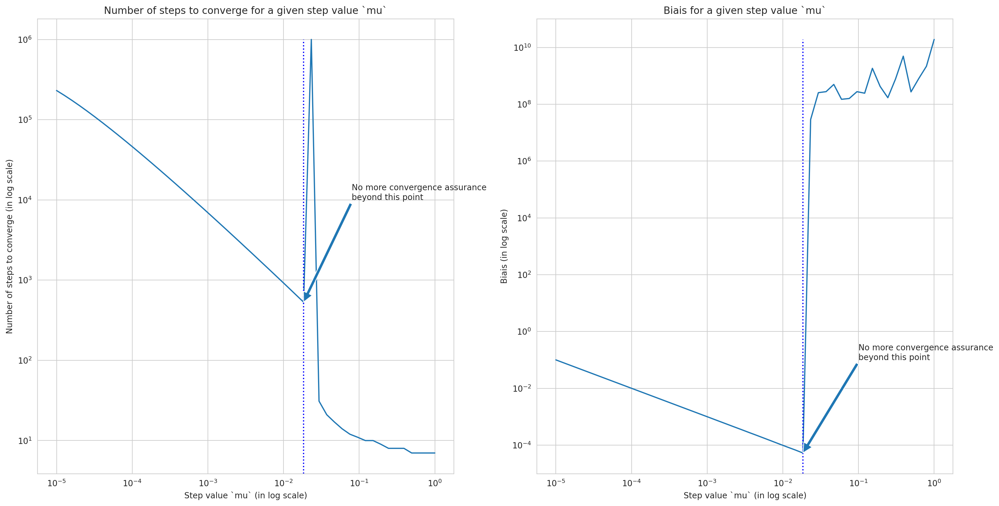

In [28]:
from tqdm import tqdm

mu_list = np.logspace(-5, 0, 50)

nb_steps_list = []
biais_list = []

for mu in tqdm(mu_list):
    res = desc_grad_const(quadraticn_, x0, mu=mu, max_step=1_000_000, no_error=True)
    nb_steps_list.append(len(res))
    biais_list.append(np.linalg.norm(x_exact - res[-1]))

threshold_idx = np.argmin(biais_list)
mu_threshold = mu_list[threshold_idx]

_, ax = plt.subplots(ncols=2, figsize=(20, 10))
ax[0].plot(mu_list, nb_steps_list)
ax[0].vlines(mu_threshold, 0, np.max(nb_steps_list), linestyles="dotted", colors="blue")

ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].annotate("No more convergence assurance\nbeyond this point",
               (mu_threshold,nb_steps_list[threshold_idx]), (0.8e-1,1e4), arrowprops={})
ax[0].set_title("Number of steps to converge for a given step value `mu`")
ax[0].set_ylabel("Number of steps to converge (in log scale)")
ax[0].set_xlabel("Step value `mu` (in log scale)")

ax[1].plot(mu_list, biais_list)
ax[1].vlines(mu_threshold, 0, np.max(biais_list), linestyles="dotted", colors="blue")

ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].annotate("No more convergence assurance\nbeyond this point",
               (mu_threshold,biais_list[threshold_idx]), (1e-1,1e-1), arrowprops={})
ax[1].set_title("Biais for a given step value `mu`")
ax[1].set_ylabel("Biais (in log scale)")
ax[1].set_xlabel("Step value `mu` (in log scale)");

Here, we can see that, as expected, the higher the step value, the faster the convergence will be.\
It is also important to note that beyond a certain step value (between `0.2` and `0.1`), the biais of the algorithm start to increase. There is no more assurance that the algorithm will converge towards the optimum.

### 1ère amélioration: le choix d'un pas "optimal" à chaque étape par *backtracking* (ou rebroussement avec critère d'Armijo)

Vous devriez avoir constatés que le choix du pas de descente dans le cas constant est crucial pour garantir la convergence de l'algorithme de descente. Dans cette section on s'intéresse à un calcul adaptatif du pas de descente qui permet de mieux garantir la convergence de notre algo. Le désavantage est le temps que prend désormais chaque itération pour s'exécuter.


Ici on veut imposer la décroissance de la suite $J({\bf p}_k)$ ce qui nous assurera la convergence. Mais pour assurer la convergence vers un minimum, il faut imposer un peu plus que simplement de descendre, c'est ce que traduit le critère d'Armijo.

On prend ici deux paramètres $0<\alpha<0.5$ et $0<\beta<1$.

On cherche un $\mu$ qui vérifie:
$$ J({\bf p}_k+\mu {\bf d}_k) < J({\bf p}_k) + \alpha \, \mu \, {\bf d}_k ^T \, \nabla J({\bf p}_k)\quad (1).$$

On a vu en cours q'un tel $\mu$ existe dès que ${\bf d}_k$ est une direction de descente (c'est à dire dès que ${\bf d}_k ^T \, \nabla J({\bf p}_k) \, <\, 0$.

* On part de $\mu = 1$

* si la condition $(1)$ ci-dessus est vérifiée on choisit cette valeur de $\mu$

* sinon on change $\mu$ en $\beta \, \mu$

Et on recommence jusqu'à ce que la condition $(1)$ soit vérifiée.




#### 1. Écrire une fonction `backtracking` qui permet de calculer le pas par *backtracking* avec critère d'Armijo à une itération donnée. Pour rappel le *backtracking* a deux hyper-paramètre $\alpha$ et $\beta$ que vous mettrez par défaut à $0.4$ et $0.8$.

In [29]:
def backtrack(x0, f , dir_x, alpha=0.4, beta=0.8, *, eps=1E-10):
    """Compute the optimal size of a steps `mu`.
    Args:
        x0: actual point.
        f: objective function.
        dir_x: direction of the next step.
        alpha:
        beta:
        eps: criteria from which we will consider the sequence as "constant" (1E-6 by default).
    
    Output:
        (float) Optimal step value.
    """
    mu = 1
    
    f_x0 = f(x0) # Prevent recomputation of expensive objective function
    grad_x0 = gradient(f, x0)
    
    while (mu >= eps and f(x0 + mu * dir_x) >= f_x0 + alpha * mu * dir_x.T @ grad_x0):
        mu *= beta
    
    return mu

La méthode est donc très analogue à la précédente

* prendre un point de départ au hasard ${\bf p_0}$.

Quand on est au point ${\bf p_k}$

* Calculer le gradient de J en ce point $\nabla J({\bf p_k})$

* Choisir une direction de descente ${\bf d}_k = - \nabla J({\bf p}_k)$

* Trouver $\mu_k$ par "backtracking" dans la direction ${\bf d}_k$

* Avancer dans cette direction et avec ce pas : ${\bf p}_{k+1} = {\bf p}_k + \mu \, {\bf d}_k$

et on recommence ces étapes jusqu'à ce qu'on arrive à un point fixe c.a.d. que 
$|| {\bf p}_{k+1} - {\bf p}_k|| < \varepsilon$ avec $\varepsilon$ une toute petite valeur.

#### 2. Implémenter cette méthode

In [30]:
def desc_grad_opti(f, p0, eps=1E-6, max_step=10_000, no_error=False):
    """Gradient descent algorithm with backtracking.
    
    Args:
        p0: starting point.
        f: objective function.
        eps: criteria from which we will consider the sequence as "constant" (1E-6 by default).
        max_step: maximal number of steps until the algorithm is considered to diverge (10_000 by default).
        no_error: should the function raise an error when it fails to converge ?
            If set to True, the list of pk is returned anyway.
            Otherwise, raise an error (the default).
    
    Output:
        (ndarray) Array containing the set of successive positions p_k.
    """ 
    def _get_pk_next(pk, f=f):
        dk = -gradient(f, pk)
        mu = backtrack(pk, f, dk, eps=eps)
        return pk + mu * dk

    return general_desc_grad(f, p0, _get_pk_next, mu=mu, eps=eps, max_step=max_step, no_error=no_error)

#### 3. Tester cette descente sur un cas simple (prendre par exemple en dimension n=10, la fonction quadraticn_ dans un cas où vous connaissez la solution).

In [31]:
dim = 2
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

x0 = np.zeros(dim)
res = desc_grad_opti(quadraticn_, x0)

print("Nb itérations:", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations: 483
x_calculé [0.99996033 0.99999957]
x_exact [1. 1.]


In [32]:
dim = 2
x_exact = np.ones(dim)

x0 = np.array([1, 0])
res = desc_grad_opti(Rosenbrock, x0)

print("Nb itérations:", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations: 6977
x_calculé [0.99956088 0.99912082]
x_exact [1. 1.]


#### 4. Comparer la descente par backtracking et la descente à pas constant (à vous de réfléchir à ce que vous voulez comparer).

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  2.86it/s]


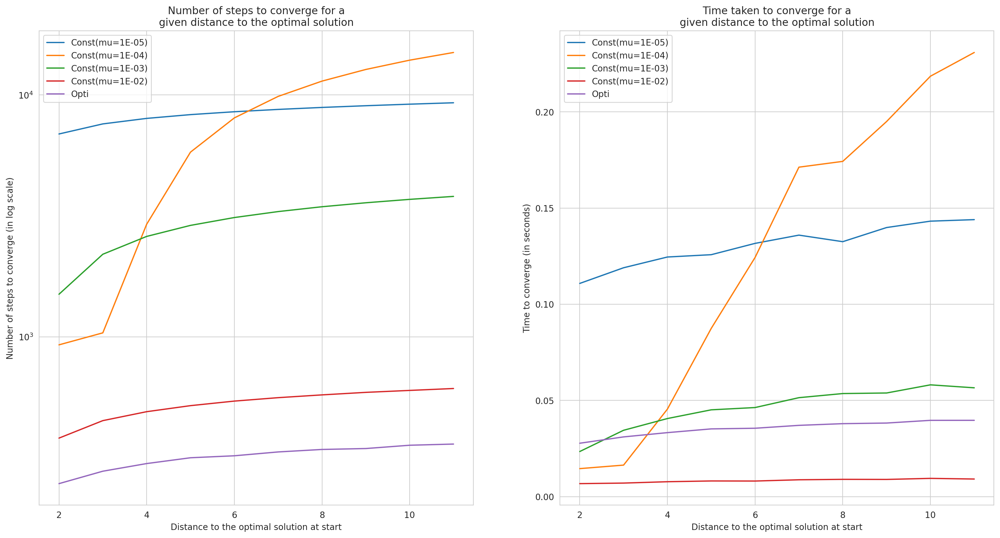

In [33]:
def benchmark_and_plot_methods(f, x_exact: np.array) -> None:
    distance_list = np.arange(2, 12)
    start_list = [np.array([1, n]) for n in range(2, 12)]
    mu_list = [1e-5, 1e-4, 1e-3, 1e-2]
    
    def _benchmark_single_method(f, nb_steps_elt, time_elt) -> None:
            start = time()
            res = f()
            end = time()

            nb_steps_elt.append(len(res))
            time_elt.append(end - start)
        
    def _benchmark_methods(x0: (int, int)):
        nb_steps_elt, time_elt = [], []

        for mu in mu_list:
            _benchmark_single_method(lambda: desc_grad_const(f, x0, mu=mu, max_step=1e6), nb_steps_elt, time_elt)
        _benchmark_single_method(lambda: desc_grad_opti(f, x0, max_step=1e6), nb_steps_elt, time_elt)
        
        return nb_steps_elt, time_elt


    nb_steps_list = []
    time_list = []

    for start in tqdm(start_list):
        nb_steps_elt, time_elt = _benchmark_methods(start)

        nb_steps_list.append(nb_steps_elt)
        time_list.append(time_elt)


    _, ax = plt.subplots(ncols=2, figsize=(20, 10))
    ax[0].plot(distance_list, nb_steps_list)

    ax[0].set_yscale('log')
    ax[0].set_title("Number of steps to converge for a\ngiven distance to the optimal solution")
    ax[0].set_ylabel("Number of steps to converge (in log scale)")
    ax[0].set_xlabel("Distance to the optimal solution at start")
    ax[0].legend([f"Const(mu={mu:.0E})" for mu in mu_list] +["Opti"])

    ax[1].plot(distance_list, time_list)

    ax[1].set_title("Time taken to converge for a\ngiven distance to the optimal solution")
    ax[1].set_ylabel("Time to converge (in seconds)")
    ax[1].set_xlabel("Distance to the optimal solution at start")
    ax[1].legend([f"Const(mu={mu:.0E})" for mu in mu_list] +["Opti"])

dim = 2
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

benchmark_and_plot_methods(quadraticn_, x_exact)

Without surprises, we can observe, on the left graph, that indeed the gradient descent with backtracking do significantly less iterations than the one with constant step.\
But on the other hand, the right graph shows that with a good mu value, the gradient descent with constant step can still be faster in a time manner.\
This can be simply explained. Though the const step gradient descent has more steps that the backtracking one, it also takes significantly less time per step. This phenomenon explains the difference in time take.

## IV- Changement de direction de descente

Maintenant nous ne nous déplacerons plus nécessairement dans la direction de $-\nabla J({\bf p_k})$ mais dans une autre direction $d_k$ qui vérifiera bien évidemment $\langle \nabla J({\bf p_k}) , d_k \rangle < 0$ afin que ce soit bien une direction de descente (et non de montée !!!).

### 1. Choisir une direction de descente selon la plus forte pente en norme $l_1$

Nous allons ici choisir la descente de plus forte pente dans le cas de la norme $\ell_1$ : la direction de descente $d_k$ suit le vecteur de la base canonique de plus grande dérivée partielle en valeur absolue. 

$$ {\bf d}_k = -\langle \nabla J({\bf p}_k),e_i \rangle \, e_i$$
où $i$ est le plus petit indice tel que:
$ \left| \dfrac{\partial J}{\partial x_i}({\bf p}_k) \right| = \|\nabla J({\bf p}_k)\|_{\infty}  $

#### a. Écrire une fonction `dsgd` qui calcule cette direction de descente de plus forte pente dans le cas de la norme $\ell_1$. 

In [34]:
def dsgd(f, x):
    """Compute the steepest gradient based on l1-norm.
    
    Args:
        f: objective function.
        x: current point.
    
    Output:
        (ndarray) Steepest gradient based on l1-norm.
    """
    grad_x = gradient(f, x)
    i = np.argmax(np.abs(grad_x))
    
    steepest = np.zeros_like(grad_x)
    steepest[i] = grad_x[i]
    
    return steepest

#### b. Ecrire la descente à pas optimal avec cette direction de descente

${\bf p}_{k+1} = {\bf p}_k + \mu_k {\bf d}_k$, où $\mu_k$ est calculé de manière optimale par l'algorithme de rebroussement avec critère d'Amijo défini plus haut.

In [35]:
def desc_l1_opti(f, p0, eps=1E-6, max_step=10_000, no_error=False):
    """Gradient descent algorithm with backtracking and in the l1-normed direction.
    
    Args:
        p0: starting point.
        f: objective function.
        eps: criteria from which we will consider the sequence as "constant" (1E-6 by default).
        max_step: maximal number of steps until the algorithm is considered to diverge (10_000 by default).
        no_error: should the function raise an error when it fails to converge ?
            If set to True, the list of pk is returned anyway
            Otherwise, raise an error
    
    Output:
        (ndarray) Array containing the set of successive positions p_k.
    """ 
    def _get_pk_next(pk, f=f):
        dk = -dsgd(f, pk)
        mu = backtrack(pk, f, dk)
        return pk + mu * dk

    return general_desc_grad(f, p0, _get_pk_next, mu=mu, eps=eps, max_step=max_step, no_error=no_error)

#### c. Tester cette descente sur un cas simple (prendrce par exemple en dimension n=10, la fonction quadraticn_ dans un cas où vous connaissez la solution).

In [36]:
dim = 2
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

x0 = np.zeros(dim)
res = desc_l1_opti(quadraticn_, x0)

print("Nb itérations:", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations: 11
x_calculé [1.00000079 1.00000004]
x_exact [1. 1.]


In [37]:
dim = 2
x_exact = np.ones(dim)

x0 = np.array([1, 0])
res = desc_l1_opti(Rosenbrock, x0)

print("Nb itérations:", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations: 4188
x_calculé [0.99965939 0.99931721]
x_exact [1. 1.]


It's interesting to note the difference in speed-up between the 2 problems.\
While on the quadratic problem, the l1-optimization significantly reduced the number of iterations (from ~500 iterations with the simple backtrack algorithm to only 11 iterations with this variant).\
On the other hand, on the Rosenbrock problem, though the number of iterations has still decreased. The result is far less remarquable (from ~7000 to 4188 iterations).

Why is that so ?\
Moving along the canonical axes on a quadratic function is particularly effcient!
On the other hand, Rosenbrock has a more "valley" aspect. Therefore, the l1-norm gradient descent moves in "crab-manner". This zig-zag effect significantly reduces the benefits of the l1-norm.

We can do better with gradient conjuge to move not along the axes of the canonic base, but along more adapted ones, depending on the function.

#### d. Comparer la descente $\ell_1$ et la descente du gradient

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 21.93it/s]


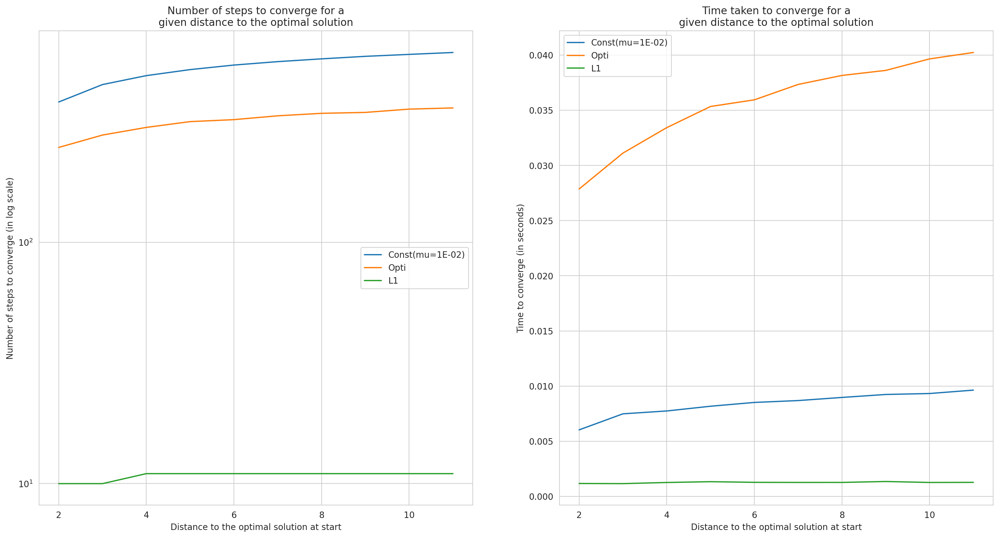

In [38]:
def benchmark_and_plot_methods(f, x_exact: np.array, methods: list, methods_names: list[str]) -> None:
    distance_list = np.arange(2, 12)
    start_list = [np.array([1, n]) for n in range(2, 12)]
    
    def _benchmark_single_method(method, x0, nb_steps_elt, time_elt) -> None:
            start = time()
            res = method(f, x0)
            end = time()

            nb_steps_elt.append(len(res))
            time_elt.append(end - start)
        
    def _benchmark_methods(x0: (int, int), methods):
        nb_steps_elt, time_elt = [], []

        for method in methods:
            _benchmark_single_method(method, x0, nb_steps_elt, time_elt)
        
        return nb_steps_elt, time_elt


    nb_steps_list = []
    time_list = []

    for start in tqdm(start_list):
        nb_steps_elt, time_elt = _benchmark_methods(start, methods)

        nb_steps_list.append(nb_steps_elt)
        time_list.append(time_elt)


    _, ax = plt.subplots(ncols=2, figsize=(20, 10))
    ax[0].plot(distance_list, nb_steps_list)

    ax[0].set_yscale('log')
    ax[0].set_title("Number of steps to converge for a\ngiven distance to the optimal solution")
    ax[0].set_ylabel("Number of steps to converge (in log scale)")
    ax[0].set_xlabel("Distance to the optimal solution at start")
    ax[0].legend(methods_names)

    ax[1].plot(distance_list, time_list)

    ax[1].set_title("Time taken to converge for a\ngiven distance to the optimal solution")
    ax[1].set_ylabel("Time to converge (in seconds)")
    ax[1].set_xlabel("Distance to the optimal solution at start")
    ax[1].legend(methods_names)


dim = 2
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

mu = 1e-2
methods_names = [f"Const(mu={mu:.0E})", "Opti", "L1"]
methods = [
    lambda f, x0: desc_grad_const(f, x0, mu=mu), 
    lambda f, x0: desc_grad_opti(f, x0), 
    lambda f, x0: desc_l1_opti(f, x0)
]

benchmark_and_plot_methods(quadraticn_, x_exact, methods, methods_names)

No debate here. The l1-norm gradient descent beats everyone on both sides: time & number of steps.

### 2. le gradient conjugué (Fletcher-Reeves)

Dans la méthode du gradient conjugué, on modifie la direction de descente en ajoutant à l'opposé du gradient un terme dépendant des directions de descente précédentes. Ce choix de descente est fait pour rendre deux directions de descentes orthogonales pour le produit scalaire qui vient de la Hessienne.

Ce calcul (qui est direct quand la fonctionnelle est quadratique) peut devenir compliqué quand la Hessienne n'est pas directement accessible.

Une des méthodes les plus populaires pour une fonctionnelle quelconque est celle proposée par Fletcher-Reeves. Nous vous invitons à faire un peu de bibliographie pour trouver comment la direction est choisie.

Réponse:\
La manière dont la prochaine itération est choisie, ne change pas:
$${\bf p}_{k+1} = {\bf p}_k + \mu \, {\bf d}_k$$
    
Toutefois la direction de descente est calculée différemment. Elle prend à présent en compte les valeurs précédentes de descente:
$${\bf d}_{k+1} = - \nabla J({\bf p}_k) + \frac{\nabla J({\bf p}_k)^T\nabla J({\bf p}_k)}{\nabla J({\bf p}_{k -1})^T\nabla J({\bf p}_{k-1})} {\bf d}_k$$

#### a. Ecrire la descente à pas optimal avec cette direction de descente

In [39]:
def desc_FR_opti(f, p0, eps=1E-6):
    g_old = -gradient(f, p0)
    pks = [p0, p0 + backtrack(p0, f, g_old) * g_old]
    sn = g_old
    i = 0

    while i < 100 and np.linalg.norm(pks[-1] - pks[-2]) > eps:
        pk = pks[-1]
        g = -gradient(f, pk)
        beta = (g.T @ g) / (g_old.T @ g_old)
        sn = g + beta * sn
        pks.append(pk + backtrack(pk, f, sn) * sn)
        g_old = g
        i += 1

    return np.array(pks)

#### b. Tester cette descente sur un cas simple (prendre par exemple en dimension n=10, la fonction quadraticn_ dans un cas où vous connaissez la solution).

In [40]:
dim = 10
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

x0 = np.zeros(dim)
res = desc_FR_opti(quadraticn_, x0)

print("Nb itérations", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations 59
x_calculé [0.999997   1.00000009 1.00000011 1.00000014 0.99999984 0.9999999
 1.00000011 0.99999996 1.         1.00000035]
x_exact [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [41]:
dim = 2
x_exact = np.ones(dim, dtype=float)

x0 = np.zeros(dim)
res = desc_FR_opti(Rosenbrock, x0)

print("Nb itérations",len(res))
print("x_calculé",res[-1])
print("x_exact",x_exact)

Nb itérations 33
x_calculé [1.00007358 1.00014784]
x_exact [1. 1.]


### 2. le gradient conjugué (Polack-Ribière)

Une méthode alternative est celle proposée par Polack-Ribière. Nous vous invitons à faire un peu de bibliographie pour trouver comment la direction est choisie.

Réponse:

De manière similaire au gradient conjugué de Fletcher-Reeves, la direction de descente est calculée de la manière suivante avec la méthode de Polack-Ribière:
$${\bf d}_{k+1} = - \nabla J({\bf p}_k) + \frac{\nabla J({\bf p}_k)^T\left(\nabla J({\bf p}_k)-\nabla J({\bf p}_{k-1})\right)}{\nabla J({\bf p}_{k -1})^T\nabla J({\bf p}_{k-1})} {\bf d}_k$$

#### a. Ecrire la descente à pas optimal avec cette direction de descente

In [42]:
def desc_PR_opti(f, p0, eps=1E-6):
    g_old = -gradient(f, p0)
    pks = [p0, p0 + backtrack(p0, f, g_old) * g_old]
    sn = g_old
    i = 0

    while i < 100 and np.linalg.norm(pks[-1] - pks[-2]) > eps:
        pk = pks[-1]
        g = -gradient(f, pk)
        beta = (g.T @ (g - g_old)) / (g_old.T @ g_old)
        sn = g + beta * sn
        pks.append(pk + backtrack(pk, f, sn) * sn)
        g_old = g
        i += 1

    return np.array(pks)

#### b. Tester cette descente sur un cas simple (prendre par exemple en dimension n=10, la fonction quadraticn_ dans un cas où vous connaissez la solution).

In [43]:
dim = 10
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

x0 = np.zeros(dim)
res = desc_PR_opti(quadraticn_, x0)

print("Nb itérations", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations 63
x_calculé [1.00000676 0.99999999 1.00000001 1.00000052 1.00000019 1.00000008
 1.00000002 0.99999984 0.99999988 1.00000004]
x_exact [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [44]:
dim = 2
x_exact = np.ones(dim, dtype=float)

x0 = np.zeros(dim)
res = desc_PR_opti(Rosenbrock, x0)

print("Nb itérations",len(res))
print("x_calculé",res[-1])
print("x_exact",x_exact)

Nb itérations 19
x_calculé [0.99997126 0.99994451]
x_exact [1. 1.]


### 3. visualiser une comparaison des différents algorithmes de descente et leur sensibilité par rapport au conditionnement

Nous vous proposons de visualiser le comportement de ces différents algorithmes de descente.

Tout d'abord en dimension 2, vous pouvez tracer la succession des points $p_k$ pour les algorithmes implémentés.

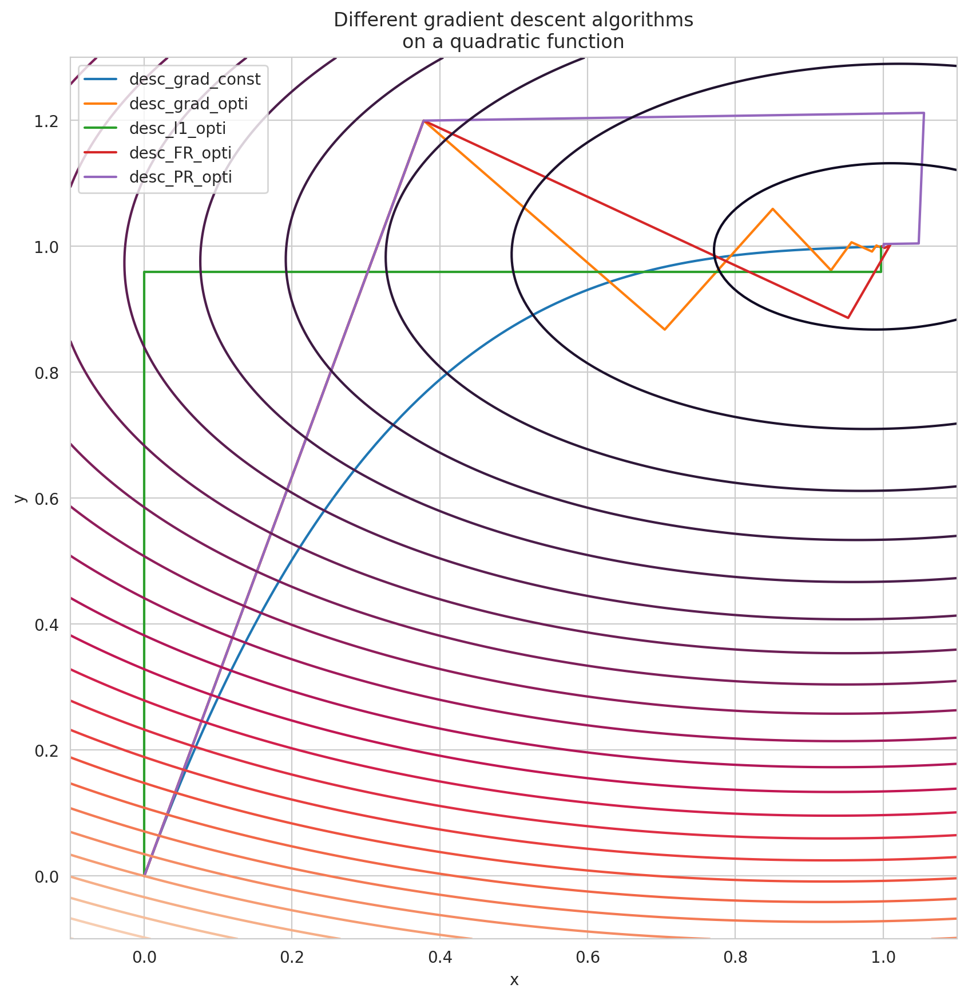

In [45]:
dim = 2
A, b = create_system(dim, cond=3)
x_exact = np.ones(dim)
b = A @ x_exact

x0 = np.zeros(dim)
plt.figure(figsize=(10,10))

methods = [desc_grad_const, desc_grad_opti, desc_l1_opti, desc_FR_opti, desc_PR_opti]
methods_names = ["desc_grad_const", "desc_grad_opti", "desc_l1_opti", "desc_FR_opti", "desc_PR_opti"]

for method in methods:
    if method == desc_grad_const:
        res = method(quadraticn_, x0, mu=0.9 / cond)
    else:
        res = method(quadraticn_, x0)

    plt.plot(res[:, 0], res[:, 1],label=method)

plt.legend(methods_names)

nb_pts, x_mi, x_ma, y_mi, y_ma = 200, -0.1, 1.1, -0.1, 1.3

x, y = np.linspace(x_mi, x_ma, nb_pts), np.linspace(y_mi, y_ma, nb_pts)
X, Y = np.meshgrid(x, y)

Z = np.array([
    [quadraticn_(np.array([X[i,j], Y[i,j]])) for j in range(nb_pts)]
    for i in range (nb_pts)
])

plt.title("Different gradient descent algorithms\non a quadratic function") 
plt.xlabel("x")
plt.ylabel("y")

plt.contour(X, Y, Z, 25);

En dimension n plus grande (par exemple n=10), vous pourrez tracer le nombre d'itérations nécessaires pour converger en fonction du conditionnement (5,10,50,100,500,1000).

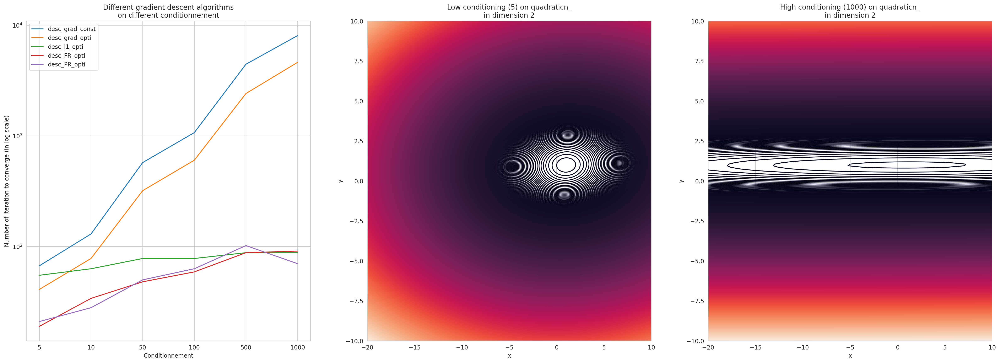

In [46]:
dim = 10
cond_list = (5, 10, 50, 100, 500, 1000)
    
_, ax = plt.subplots(ncols=3, figsize=(30, 10))
x_exact = np.ones(dim)
x0 = np.zeros(dim)

nb_steps_list = []
for cond in cond_list:
    A, b = create_system(dim, cond=cond)
    b = A @ x_exact
    
    nb_steps_methods = []
    for method in methods:
        if method == desc_grad_const:
            res = method(quadraticn_, x0, mu=0.9 / cond)
        else:
            res = method(quadraticn_, x0)
        nb_steps_methods.append(len(res))
            
    nb_steps_list.append(nb_steps_methods)

ax[0].plot(nb_steps_list)
ax[0].legend(methods_names)
ax[0].set_title("Different gradient descent algorithms\non different conditionnement")
ax[0].set_yscale('log')
ax[0].set_xlabel("Conditionnement")
ax[0].set_ylabel("Number of iteration to converge (in log scale)")
ax[0].set_xticks(range(len(cond_list)), cond_list)

plot_quadratic2_(cond_list[0], ax=ax[1], title=f"Low conditioning ({cond_list[0]}) on quadraticn_\nin dimension 2")
plot_quadratic2_(cond_list[-1], ax=ax[2], title=f"High conditioning ({cond_list[-1]}) on quadraticn_\nin dimension 2");

Here we see the evolution of the number of iterations versus the conditioning of the quadratic problem. It is clear that the higher the conditioning, the more iterations the gradient descent algorithms need to find the minimum. However, it is also interesting to note that the algorithms seeking to take a different direction from the gradient are less affected by the conditioning. This is particularly the case for the gradient descent algorithm based on the L1 norm.

To understand the intuition of this evolution, we can observe the 2 images on the right. We can see that a quadratic problem with a weak conditioning has a bowl shape, whereas when it has a strong conditioning, the bowl becomes very elongated and forms a narrow valley. It is particularly in the context of a narrow valley like this that gradient descent algorithms have more difficulty in finding the minimum. They tend to have more of a zig-zag motion.

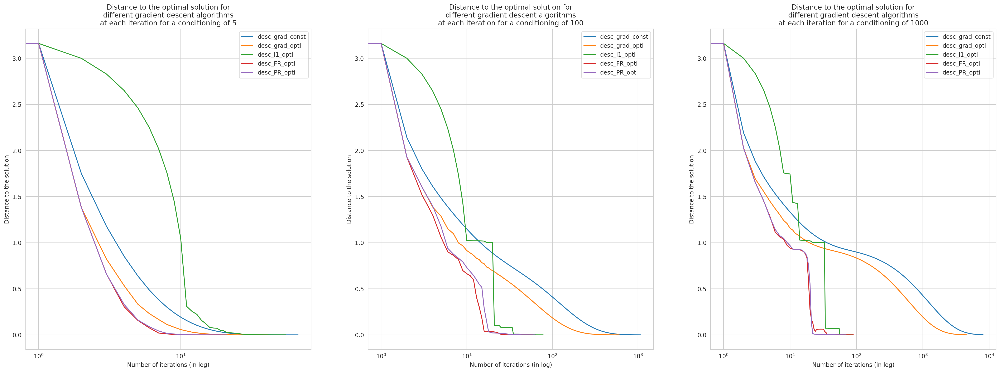

In [47]:
dim = 10
cond_list = (5, 100, 1000)
    
_, ax = plt.subplots(ncols=3, figsize=(30, 10))
x_exact = np.ones(dim)
x0 = np.zeros(dim)

for i, cond in enumerate(cond_list):
    A, b = create_system(dim, cond=cond)
    b = A @ x_exact

    nb_steps_methods = []
    for method in methods:
        if method == desc_grad_const:
            res = method(quadraticn_, x0, mu=0.9 / cond)
        else:
            res = method(quadraticn_, x0)

        res = np.vstack((x0, res)) # XXX: tricks for log-scale
        ax[i].plot(np.linalg.norm(res - x_exact, axis=1))

    ax[i].legend(methods_names)
    ax[i].set_title(f"Distance to the optimal solution for\ndifferent gradient descent algorithms\nat each iteration for a conditioning of {cond}")
    ax[i].set_xscale('log')
    ax[i].set_xlabel("Number of iterations (in log)")
    ax[i].set_ylabel("Distance to the solution")

### 4. comportement si la fonction à optimiser n'est pas convexe sur $\mathbb{R}^2$ et n'admet pas un minimum global

Nous vous proposons de regarder le comportement de ces différents algorithmes de descente dans le cas de quelques fonctions introduites au début du TP, telles que multitrous2, cubic2.

In [48]:
dim = 2
x0 = np.ones(dim, dtype=float)
res = desc_PR_opti(multitrous2_, x0)

print("Nb itérations", len(res))
print("x_calculé", res[-1])

Nb itérations 10
x_calculé [ 2.98662243 -1.62693113]


In [49]:
dim = 2

x0 = np.ones(dim, dtype=float)
res = desc_PR_opti(cubic2_, x0)

print("Nb itérations", len(res))
print("x_calculé", res[-1])

Nb itérations 5
x_calculé [-2.96411134e+18 -2.96411134e+18]


Que constatez-vous ?

The backtrack algorithm seems to fail on those two non-convexe functions.

## V Accélérations

Il y a des stratégies standards d'accélération de descente de gradients ; on en invente même tous les ans. Il n'y a pas nécessairement de relation d'ordre entre celles-ci, certaines sont plus adaptées que d'autres à des problèmes spécifiques et inversement. On vous propose d'en implémenter $1$ parmi les 3 qui vous sont proposées ici, il s'agit en particulier d'un travail bibliographique (simple).

1. Implémenter la *Momentum Optimisation*. Cherchez à en comprendre le sens.

In [50]:
    # A VOUS .....................

2. Implémenter la *Nesterov Optimisation*. Cherchez à en comprendre le sens.

In [51]:
    # A VOUS .....................

3. Implémenter la *Adam Optimisation*. Cherchez à en comprendre le sens.

In [52]:
def adam_optimisation(f, p0, eta=0.01, eps=1E-8, beta_1 = 0.9, beta_2 = 0.999) :
    m_t, v_t = np.zeros(p0.shape), np.zeros(p0.shape)
    pks = [p0]
    t = 1

    while True:
        g_t = gradient(f, pks[-1])

        m_t = (beta_1 * m_t) + ((1 - beta_1) * g_t)
        v_t = (beta_2 * v_t) + ((1 - beta_2) * (g_t **2))

        m_t_moment = m_t / (1 - (beta_1 ** t))
        v_t_moment = v_t / (1 - (beta_2 ** t))

        pks.append(pks[-1] - ((eta / (np.sqrt(v_t_moment) + eps)) * m_t_moment))

        if np.linalg.norm(pks[-1] - pks[-2]) < eps :
            break

        t += 1

    return np.array(pks)

In [53]:
dim = 10
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

x0 = np.zeros(dim)
res = adam_optimisation(quadraticn_, x0)

print("Nb itérations", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations 505
x_calculé [0.99999975 1.         0.99999999 0.99999994 1.         1.00000001
 1.         0.99999999 1.         0.99999998]
x_exact [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


4. Comparer l'accélération choisie avec les méthodes précédentes précédentes.

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 10.15it/s]


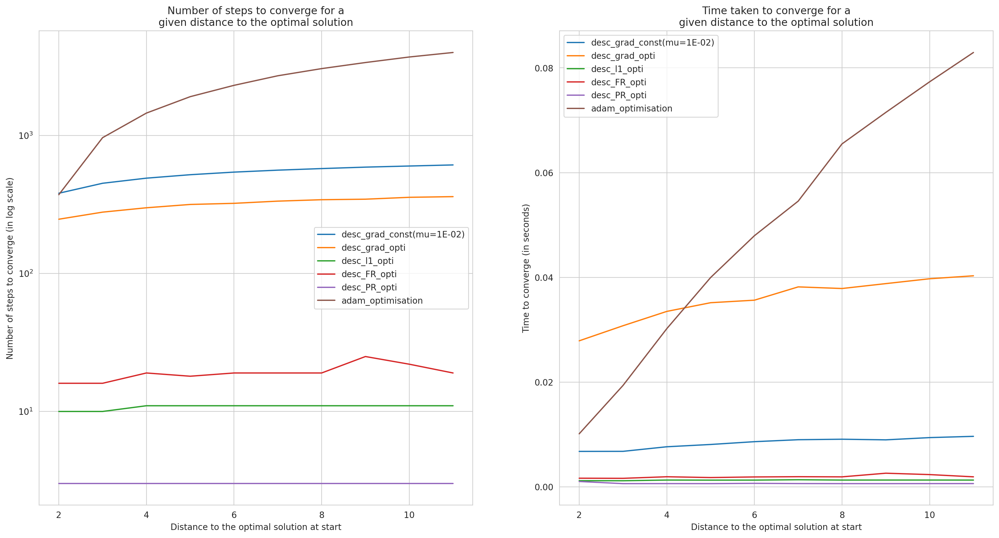

In [54]:
dim = 2
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

mu = 1e-2
methods_names = [f"desc_grad_const(mu={mu:.0E})", "desc_grad_opti", "desc_l1_opti", "desc_FR_opti", "desc_PR_opti", "adam_optimisation"]
methods = [
    lambda f, x0: desc_grad_const(f, x0, mu=mu), 
    lambda f, x0: desc_grad_opti(f, x0), 
    lambda f, x0: desc_l1_opti(f, x0),
    lambda f, x0: desc_FR_opti(f, x0),
    lambda f, x0: desc_PR_opti(f, x0),
    lambda f, x0: adam_optimisation(f, x0)
]

benchmark_and_plot_methods(quadraticn_, x_exact, methods, methods_names)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:18<00:00,  1.87s/it]


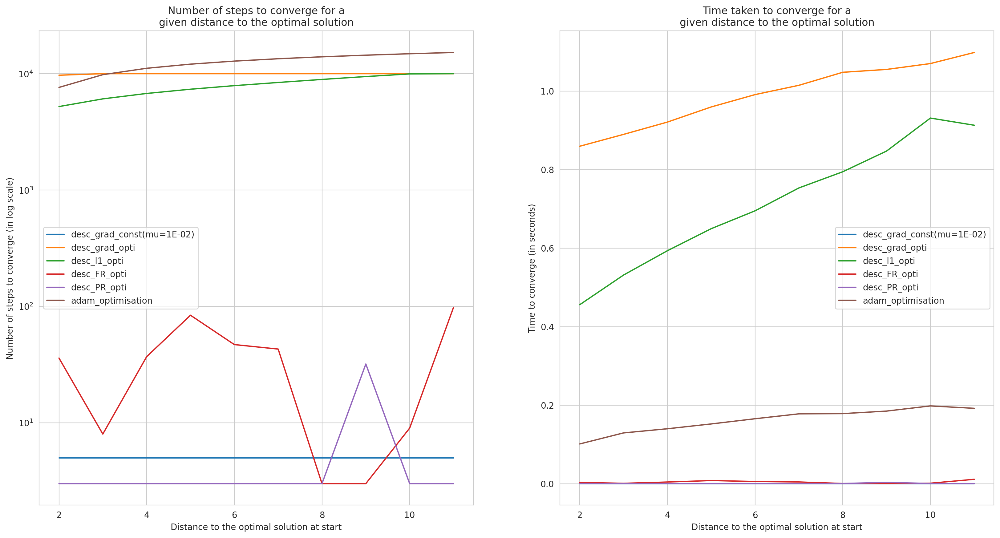

In [55]:
dim = 2
x_exact = np.ones(dim, dtype=float)

mu = 1e-2
methods_names = [f"desc_grad_const(mu={mu:.0E})", "desc_grad_opti", "desc_l1_opti", "desc_FR_opti", "desc_PR_opti", "adam_optimisation"]
methods = [
    lambda f, x0: desc_grad_const(f, x0, mu=mu, no_error=True),
    lambda f, x0: desc_grad_opti(f, x0, no_error=True ),
    lambda f, x0: desc_l1_opti(f, x0, no_error=True),
    lambda f, x0: desc_FR_opti(f, x0),
    lambda f, x0: desc_PR_opti(f, x0),
    lambda f, x0: adam_optimisation(f, x0)
]

benchmark_and_plot_methods(Rosenbrock, x_exact, methods, methods_names)

## VI - "Les" méthodes de Newton

### 1. la méthode de Newton

Dans les méthodes de descente précédentes, on cherchait à chaque étape à minimiser le Développement Limité d'ordre 1 de J au voisinage de ${\bf p_k}$: $h \mapsto J({\bf p_k}) + \nabla J({\bf p_k}) ^T h$.

Dans la méthode de Newton, on cherche à minimiser le Développement Limité d'ordre 2 de J au voisinage de ${\bf p}_k$ : $h \mapsto J({\bf p}_k) + \nabla J({\bf p}_k) ^T h + \dfrac{1}{2}h^T H_J({\bf p}_k) h$ où $H_J({\bf p}_k)$ est la Hessienne de J au point ${\bf p}_k$.

A quelle direction de descente, cette minimisation nous amène-t-elle?

Réponse:


On passe de la direction ${\bf d}_k$ à la direction ${\bf d}_{k+1}$ par la relation de récurrence:
$${\bf d}_{k+1}=-H_J({\bf p}_k)^{-1} \, \nabla J({\bf p}_k) .$$

#### a. Implémenter la méthode de Newton.

En apparence, implémenter la méthode de Newton (qui converge très rapidement) ne semble pas différent que les méthodes de descente vues précédemment (Une fois qu'on a obtenu ${\bf d}_k$ comme direction de descente, on peut calculer $\mu_k$ et donc itérer "tranquillement).

En réalité cette méthode n'est pas facile à implémenter et surtout coûteuse car il faut calculer à chaque itération la Hessienne de $J$ au point ${\bf p}_k)$ et ensuite l'inverser.

Vous pouvez essayer de l'implémenter dans le cas particulier de la fonction quadraticn_ car alors la matrice Hessienne est constante et ne dépend donc pas du point ${\bf p}_k)$, ce qui vous permet de calculer une fois pour toute son inverse (par le module linalg de numpy par exemple).

Par contre implémenter cette méthode dans le cas d'une fonction dont on ne connaît pas explicitement la Hessienne, et surtout l'inverse de cette dernière est à déconseiller.

In [56]:
def quad_hessian(A):
    return 2 * A

def newton_method(f, p0, A, eps=1E-6):
    inv_hessian = np.linalg.inv(quad_hessian(A))
    g_old = -gradient(f, p0)
    pks = [p0, p0 + inv_hessian @ g_old]
    i = 0

    while i < 100 and np.linalg.norm(pks[-1] - pks[-2]) > eps:
        pk = pks[-1]
        g = -gradient(f, pk)
        pks.append(pk + inv_hessian @ g)
        i += 1

    return np.array(pks)

#### b. Tester cette descente sur un cas simple (prendre par exemple en dimension n=10, la fonction quadraticn_ dans un cas où vous connaissez la solution).

In [57]:
dim = 10
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

x0 = np.zeros(dim)
res = newton_method(quadraticn_, x0, A)

print("Nb itérations", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations 23
x_calculé [0.99999871 0.99999975 0.99999973 0.99999966 0.99999973 0.99999974
 0.99999981 0.99999977 0.99999974 0.99999981]
x_exact [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


### 2. la méthode de quasi-Newton

Pour éviter les inconvénients de la méthode de Newton, en particulier lorsque la Hessienne n'est plus constante, une idée est d'introduire une suite de matrices $H_k$ qui sont une approximation de $\bf {l'inverse}$ de la Hessienne au point ${\bf p}_k$.

Cette méthode qui s'appelle méthode BFGS (des initiales des auteurs) qui l'ont introduite, a l'avantage (énorme) de ne pas nécessiter le calcul de la Hessienne ou de son inverse. on retrouve donc en terme d'implémentation la simplicité des méthodes de descente, tout en ayant les propriétés de convergence de la méthode de Newton.

L'algorithme le décrivant est le suivant (très analogue aux algorithmes de descente:

La méthode est donc très analogue à la précédente

* prendre un point de départ quelconque ${\bf p}_0$, par exemple ${\bf p}_0 = ${\bf 0}
* prendre une matrice $H_0$ quelconque, par exemple $H_0= I_n$ 

Quand on est au point ${\bf p}_k$

* Choisir une direction de descente ${\bf d}_k = -H_k \, \nabla J({\bf p}_k)$

* Trouver $\mu_k$ par "backtracking" dans la direction ${\bf d}_k$

* Avancer dans cette direction et avec ce pas : ${\bf p}_{k+1} = {\bf p}_k + \mu \, {\bf d}_k$

* Calculer $H_{k+1}$ en fonction de $H_{k+1}$, $J({\bf p}_k)$, $J({\bf p}_{k+1})$, $\nabla J({\bf p}_k)$ et $\nabla J({\bf p}_{k+1})$.

et on recommence ces étapes jusqu'à ce qu'on arrive à un point fixe c.a.d. que 
$|| {\bf p}_{k+1} - {\bf p}_k|| < \varepsilon$ avec $\varepsilon$ une toute petite valeur.


Faire un petit peu de biblio pour trouver comment se calcule la suite des matrices $H_{k+1}$. La formule qui semble à première vue horrible, se programme en Python en 1 ligne en ne faisant que des multiplications de matrices et de vecteurs.

Réponse:\
Le calcule itératif de la Hessienne par la méthode BFGS suit la formule suivante:
$$H_{k+1} = H_k + \frac{y_k y_k^T}{y_k^T s_k} - \frac{H_k s_k s_k^T H_k}{s_k^T H_k s_k}$$

avec:
$$s_k = p_{k+1} - p_k$$
$$y_k = \nabla J({\bf p}_{k+1}) - \nabla J({\bf p}_k)$$

#### a. Implémenter la méthode de Quasi-Newton BFGS.

In [58]:
def desc_BFGS_opti(f, x0, eps=1E-8):
    i = 1
    shape_ = x0.shape[0]
    I = np.identity(shape_)
    B_k = I
    p_k = - B_k @ gradient(f, x0)
    alpha_k = backtrack(x0, f, p_k)
    s_k = alpha_k * p_k
    xks = [x0, x0 + s_k]
    norm_value = np.linalg.norm(xks[-1] - xks[-2])

    while i < 10000 and norm_value >= eps:
    
        y_k = gradient(f, xks[-1]) - gradient(f, xks[-2])
        y_k = y_k.reshape(-1, 1)
        s_t = s_k.reshape(-1, 1)

        B_k = (I - ((s_t @ y_k.T) / (y_k.T @ s_t))) @ B_k @ (I - ((y_k @ s_t.T) / (y_k.T @ s_t))) + ((s_t @ s_t.T) / (y_k.T @ s_t))

        x_k = xks[-1]
        p_k = B_k @ - gradient(f, x_k)

        alpha_k = backtrack(x_k, f, p_k)

        s_k = alpha_k * p_k
        xks.append(x_k + s_k)

        norm_value = np.linalg.norm(xks[-1] - xks[-2])
        i += 1

    return np.array(xks)

#### b. Tester cette descente sur un cas simple (prendre par exemple en dimension n=10, la fonction quadraticn_ dans un cas où vous connaissez la solution).

In [59]:
dim = 10
cond = 100
A, b = create_system(dim, cond)
x_exact = np.ones(dim)
b = A @ x_exact

x0 = np.zeros(dim)
res = desc_BFGS_opti(quadraticn_, x0)

print("Nb itérations", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations 19
x_calculé [0.99999921 0.99999997 1.00000008 1.00000008 0.99999995 0.99999999
 1.00000001 1.         0.99999997 1.00000012]
x_exact [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [60]:
dim = 2
cond = 100
x_exact = np.ones(dim, dtype=float)

x0 = np.zeros(dim)
res = desc_BFGS_opti(Rosenbrock, x0)

print("Nb itérations", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations 22
x_calculé [1. 1.]
x_exact [1. 1.]


In [61]:
dim = 2
cond = 10
x_exact = np.array([-9, -9])

x0 = np.ones(dim, dtype=float)
res = desc_BFGS_opti(cubic2_, x0)

print("Nb itérations", len(res))
print("x_calculé", res[-1])
print("x_exact", x_exact)

Nb itérations 4
x_calculé [1.5217391 1.5217391]
x_exact [-9 -9]


3. Comparer la méthode de quasi-Newton aux descentes précédentes.

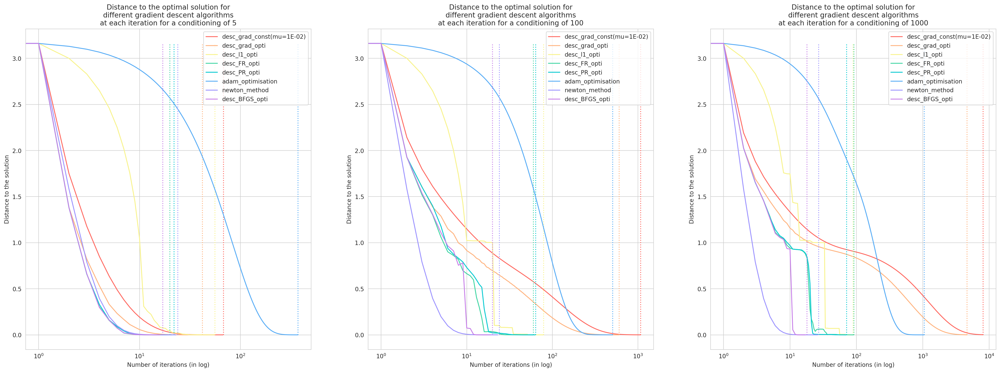

In [64]:
dim = 10
cond_list = (5, 100, 1000)
    
_, ax = plt.subplots(ncols=3, figsize=(30, 10))
x_exact = np.ones(dim)
x0 = np.zeros(dim)

methods_2 = [desc_grad_const, desc_grad_opti, desc_l1_opti, desc_FR_opti, desc_PR_opti, adam_optimisation, newton_method, desc_BFGS_opti]
methods_names_2 = [f"desc_grad_const(mu={mu:.0E})", "desc_grad_opti", "desc_l1_opti", "desc_FR_opti", "desc_PR_opti", "adam_optimisation", "newton_method", "desc_BFGS_opti"]
methods_colors = ["#ff6961", "#ffb480", "#f8f38d", "#42d6a4", "#08cad1", "#59adf6", "#9d94ff", "#c780e8"]

for i, cond in enumerate(cond_list):
    A, b = create_system(dim, cond=cond)
    b = A @ x_exact

    nb_steps_methods = []
    for method, color, name in zip(methods_2, methods_colors, methods_names_2):
        if (method == desc_grad_const):
            res = method(quadraticn_, x0, mu=0.9 / cond)
        elif (method == newton_method):
            res = method(quadraticn_, x0, A)
        else:
            res = method(quadraticn_, x0)

        res = np.vstack((x0, res)) # XXX: tricks for log-scale
        ax[i].plot(np.linalg.norm(res - x_exact, axis=1), color=color, label=name)
        ax[i].vlines(len(res), 0, np.linalg.norm(res[0] - x_exact), linestyle="dotted", color=color)

    ax[i].legend()
    ax[i].set_title(f"Distance to the optimal solution for\ndifferent gradient descent algorithms\nat each iteration for a conditioning of {cond}")
    ax[i].set_xscale('log')
    ax[i].set_xlabel("Number of iterations (in log)")
    ax[i].set_ylabel("Distance to the solution")